## z 1.1

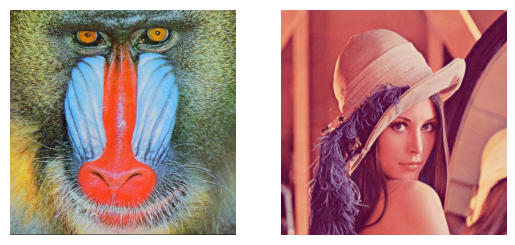

In [35]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

lena_path = r"C:\Users\patry\Desktop\air_iss\Advanced_Vision_Systems\lena.png"
mandrill_path = r"C:\Users\patry\Desktop\air_iss\Advanced_Vision_Systems\mandril.jpg"

I_mandrill = cv2.cvtColor(cv2.imread(mandrill_path), cv2.COLOR_BGR2RGB)
I_lena = cv2.cvtColor(cv2.imread(lena_path), cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(1, 2)

axs[0].imshow(I_mandrill)
axs[1].imshow(I_lena)
axs[0].set_axis_off()
axs[1].set_axis_off()

In [36]:
I_mandrill.shape, I_mandrill.size, I_mandrill.dtype

((512, 512, 3), 786432, dtype('uint8'))

## zad 1.2

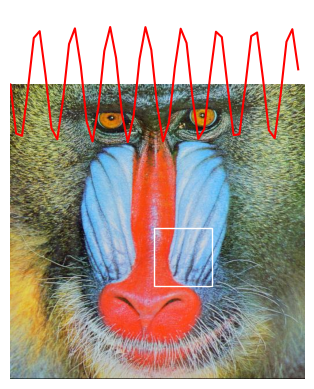

In [37]:
from matplotlib.patches import Rectangle

X = np.linspace(0, 500)
Y = 100*np.sin(X/10)

rect = Rectangle((250, 250), 100, 100, fill=False, ec='w')

fig, ax = plt.subplots(1)
ax.imshow(I_mandrill)
ax.plot(X, Y, 'r', markersize=10)
ax.set_axis_off()

ax.add_patch(rect)

## zad 1.3

In [38]:
IG = cv2.cvtColor(I_mandrill, cv2.COLOR_BGR2GRAY)
IHSV = cv2.cvtColor(I_mandrill, cv2.COLOR_BGR2HSV)

IH = IHSV[:, :, 0]
IS = IHSV[:, :, 1]
IV = IHSV[:, :, 2]

list_i = [IH, IS, IV]

fig, axs = plt.subplots(1, 3)
fig.set_figwidth(180)
fig.set_figheight(60)

for i in range(len(list_i)):
    axs[i].imshow(list_i[i], cmap='gray')
    axs[i].set_axis_off()

(-0.5, 511.5, 511.5, -0.5)

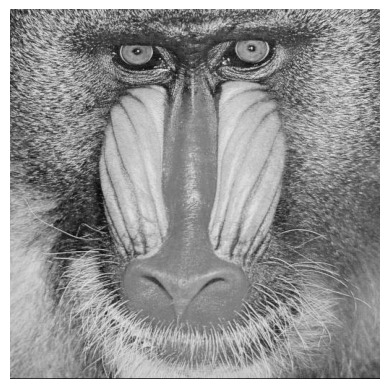

In [39]:
def RGB2Gray(I):
    return 0.299*I[:, :, 0] + 0.587*I[:, :, 1] + 0.114*I[:, :, 2]


plt.imshow(RGB2Gray(I_mandrill), cmap='gray')
plt.axis('off')

## zad 1.4

Text(0.5, 1.0, 'Big Monky')

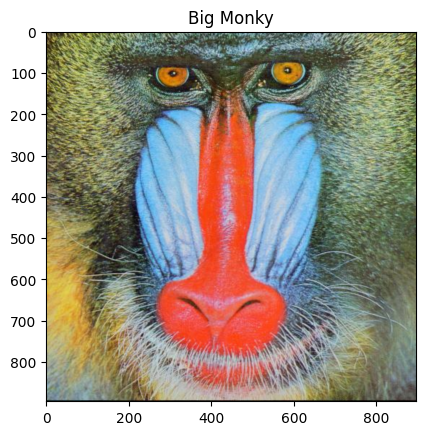

In [40]:
height, width = I_mandrill.shape[:2] 
scale = 1.75

Ix2 = cv2.resize(I_mandrill, (int(width * scale), int(height * scale)))
plt.imshow(Ix2)
plt.title('Big Monky')

## zad 1.5

In [41]:
I_mandrill = I_mandrill.astype(np.uint8)
I_lena = I_lena.astype(np.uint8)

# dodawwanie
I_sum = I_mandrill + I_lena

# odejmowanie 
I_dif = I_mandrill - I_lena

# mnożenie 
I_mult = I_mandrill * I_lena

# kombiancja liniowa
alpha, beta = 0.1, 0.9
I_comb = cv2.addWeighted(I_mandrill, alpha, I_lena, beta, 0)

# moduł z róznic (cv2 i ręcznie)
I_abs_manual = np.abs(I_mandrill.astype(np.int16) - I_lena.astype(np.int16)).astype(np.uint8)
I_abs_opencv = cv2.absdiff(I_mandrill, I_lena)  

I_list = [I_sum, I_dif, I_mult, I_comb, I_abs_manual, I_abs_opencv]
titles = ["Dodawanie", "Odejmowanie", "Mnożenie", "Kombinacja liniowa", "Moduł ręcznie", "Moduł OpenCV"]

fig, axs = plt.subplots(2, 3, figsize=(15, 10))
axs = axs.flatten()

fig.set_figwidth(180)
fig.set_figheight(120)

for i in range(len(I_list)):
    axs[i].imshow(I_list[i], cmap="gray")
    axs[i].set_title(titles[i])
    axs[i].axis("off")

In [42]:
def hist(I):
    histogram = np.zeros((256, 1), np.float32)
    h, w = I.shape  

    for y in range(h):
        for x in range(w):
            pixel_value = I[y, x]  
            histogram[pixel_value] += 1  

    return histogram

(array([161.,  45.,  11.,  11.,  13.,   9.,   2.,   0.,   2.,   2.]),
 array([   0.        ,  817.59997559, 1635.19995117, 2452.80004883,
        3270.39990234, 4088.        , 4905.60009766, 5723.20019531,
        6540.79980469, 7358.39990234, 8176.        ]),
 <BarContainer object of 10 artists>)

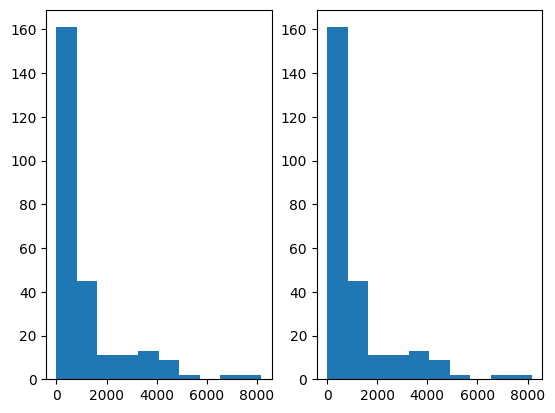

In [43]:
hist_manual = hist(IH)
hist_cv2 = cv2.calcHist([IH], [0], None, [256], [0, 256])

fig, ax = plt.subplots(1, 2)
ax[0].hist(hist_manual)
ax[1].hist(hist_cv2)


(array([85.,  0.,  3.,  8., 15., 33., 26., 36., 23., 27.]),
 array([   0. ,  223.5,  447. ,  670.5,  894. , 1117.5, 1341. , 1564.5,
        1788. , 2011.5, 2235. ]),
 <BarContainer object of 10 artists>)

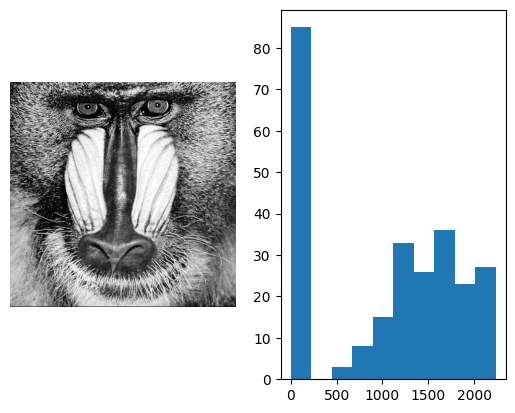

In [47]:
IGE = cv2.equalizeHist(IG)

_, ax = plt.subplots(1, 2)

ax[0].imshow(IGE, cmap='gray')
ax[0].set_axis_off()
ax[1].hist(hist(IGE))

(array([  5.,   7.,  13.,  10.,  11.,  15.,  16.,  51., 109.,  19.]),
 array([  12.        ,  155.69999695,  299.3999939 ,  443.1000061 ,
         586.79998779,  730.5       ,  874.20001221, 1017.90002441,
        1161.59997559, 1305.30004883, 1449.        ]),
 <BarContainer object of 10 artists>)

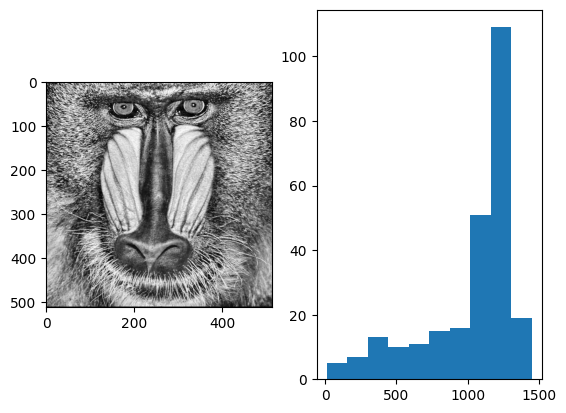

In [49]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

_, ax = plt.subplots(1, 2)

I_clas = clahe.apply(IG)

ax[0].imshow(I_clas, cmap='gray')
ax[1].hist(hist(I_clas))

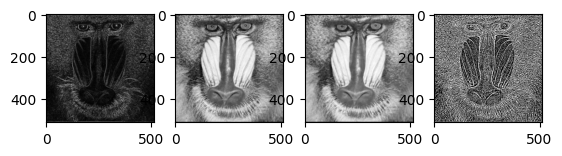

In [68]:
from cv2 import Sobel, GaussianBlur, Laplacian, medianBlur

_, axs = plt.subplots(1, 4)

sobel_x = Sobel(IG, cv2.CV_64F, 0, 1, ksize=3)

sobel_y = Sobel(IG, cv2.CV_64F, 1, 0, ksize=3) # obrazek, typ zmiennej, kierunk Y, X, wieulkosc kernel

I_sobel = cv2.magnitude(sobel_x, sobel_y)

I_gauss = GaussianBlur(IG, (5, 5), 0) # obrazek, kernel_size, std

I_median = medianBlur(IG, 5)

I_laplace = Laplacian(IG, 0, ksize=5)

axs[0].imshow(I_sobel, cmap='gray')
axs[1].imshow(I_gauss, cmap='gray')
axs[2].imshow(I_median, cmap='gray')
axs[3].imshow(I_laplace, cmap='gray')
